## ProjF2 - Data Exploration

Group Number: 141

Sakshi Basapure, sbasapu

Nilesh Singh, nsrajesh

Meet Agarwal, mpatel29

In [191]:
import tensorflow as tf
import os
import pandas as pd
import matplotlib.pyplot as plt
import matplotlib.image as mpimg
from PIL import Image, UnidentifiedImageError
import numpy as np

### 1. Load and Visualize Data

In [186]:
# getting the training and validation data from the 
data_dir = "D:/NNDL/archive/New Plant Diseases Dataset(Augmented)/New Plant Diseases Dataset(Augmented)"
train_dir = data_dir + "/train"
valid_dir = data_dir + "/valid"
diseases = os.listdir(train_dir)

#### Displaying Training Images

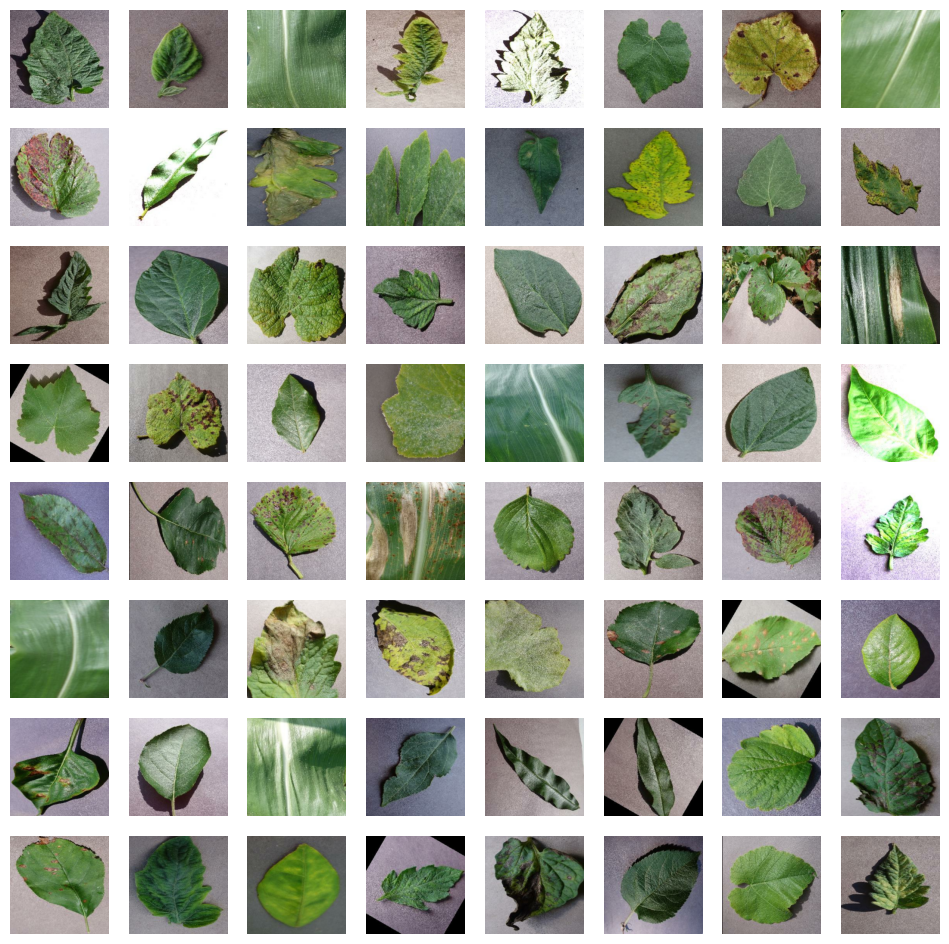

In [187]:
def show_batch(data, n=8):
    # Get the first batch of data
    images, labels = next(iter(data))

    # Select the first n*n images from the batch
    images = images[:n*n]

    # If the image data is in the range [0, 1], scale it to the range [0, 255]
    if tf.reduce_max(images[0]) <= 1.0:
        images *= 255.0

    # Convert the image data to an integer type
    images = tf.cast(images, tf.uint8)

    # Plot the images in a n by n grid
    fig, axs = plt.subplots(n, n, figsize=(12, 12))
    axs = axs.ravel()
    for i in range(n*n):
        axs[i].imshow(images[i])
        axs[i].axis('off')  # Hide the axes
    plt.show()

# Show the first batch of training images
show_batch(train_data)

#### Displaying Class Label and corresponding image

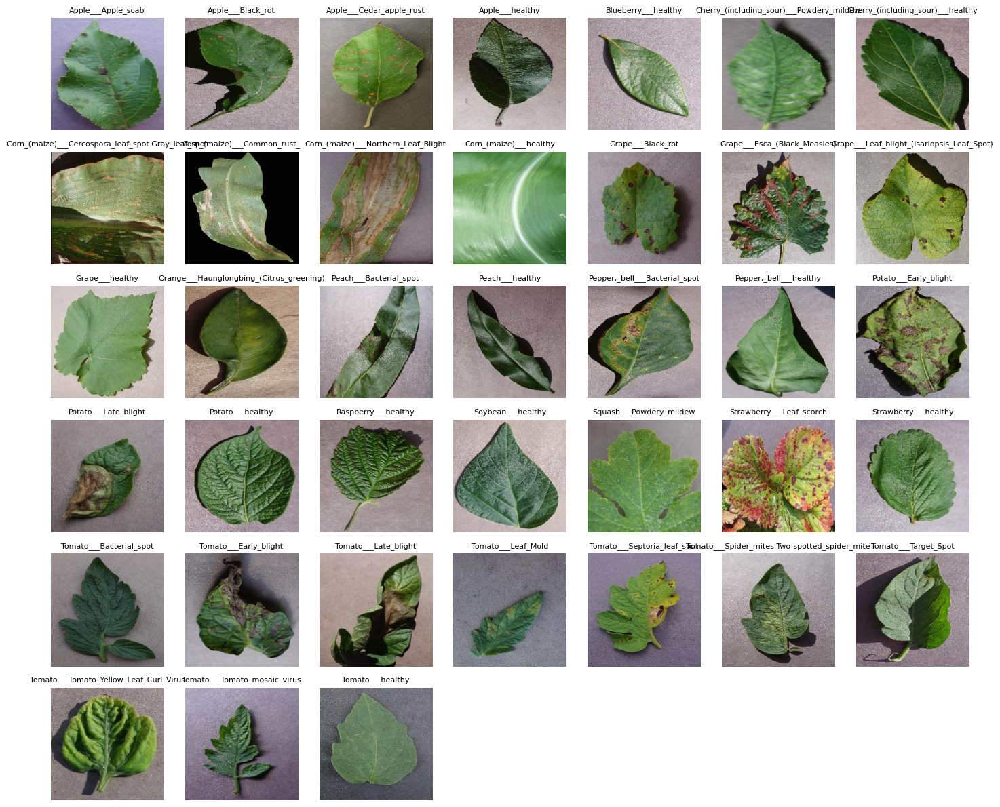

In [189]:
def display_one_image_per_class(dataset_path):
    # Get the number of classes
    class_names = sorted(os.listdir(dataset_path))
    num_classes = len(class_names)
    
    # Calculate the number of rows and columns for the grid
    rows = int(num_classes ** 0.5)
    cols = num_classes // rows
    if num_classes % rows != 0:
        cols += 1

    # Create a subplot grid
    fig, axes = plt.subplots(rows, cols, figsize=(cols * 2, rows * 2))

    # Iterate through each class directory
    for i, class_name in enumerate(class_names):
        class_path = os.path.join(dataset_path, class_name)
        
        # Get the first image file in the class directory
        img_files = os.listdir(class_path)
        if not img_files:
            continue  # Skip if there are no images in the class directory
            
        img_file = img_files[0]
        img_path = os.path.join(class_path, img_file)
        
        # Load the image
        img = mpimg.imread(img_path)
        
        # Plot the image
        ax = axes[i // cols, i % cols]
        ax.imshow(img)
        ax.set_title(class_name, fontsize=8)
        ax.axis('off')

    # Remove any remaining empty subplots
    for i in range(num_classes, rows * cols):
        fig.delaxes(axes.flatten()[i])

    # Adjust layout and show plot
    plt.tight_layout()
    plt.show()

# Call the function to display one image from each class
display_one_image_per_class(train_dir)


### 2. Compute Some Statistics from your Data

### Characteristics of Input

#### Number of training and validation images

In [162]:
def count_images(directory):
    total_images = 0
    for root, dirs, files in os.walk(directory):
        total_images += len(files)
    return total_images

# Count the total number of training and validation images
total_train_images = count_images(train_dir)
total_valid_images = count_images(valid_dir)

print("Total number of training images:", total_train_images)
print("Total number of validation images:", total_valid_images)

Total number of training images: 70295
Total number of validation images: 17572


#### Pie Chart - Data Distributions

We've presented three sets of pie charts:

1. Distribution between Training and Validation Sets
2. Distribution of Healthy and Diseased Plants in the Training Dataset
3. Distribution of Healthy and Diseased Plants in the Validation Dataset

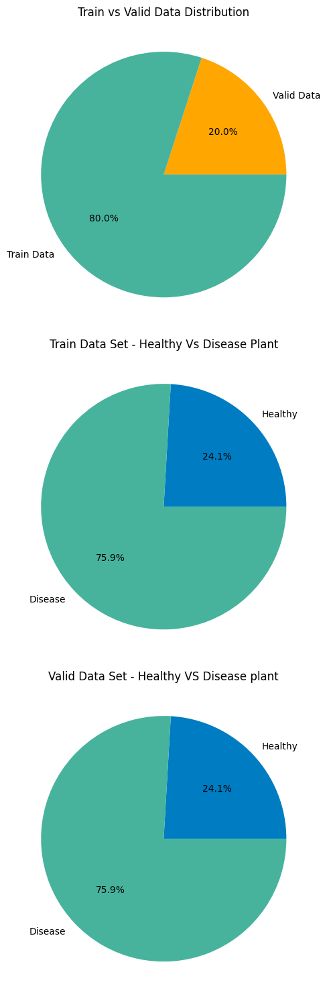

In [192]:
def create_data_frame(path):
    list_plant = []
    list_category = []
    list_disease = []
    list_path = []
    list_plant_category = []
    list_image_size = []
    list_image_type = []
    list_size = []
    
    for path, directory, files in os.walk(path, topdown=False):
        for name in files:
            # Skip if file is not an image file
            if not name.lower().endswith(('.png', '.jpg', '.jpeg', '.gif', '.bmp')):
                continue
            
            plant_category = category = path.split("/")[-1]
            plant = plant_category.split("_")[0]
            category = plant_category.split("_")[-1]
            disease = 0 if category == "healthy" else 1
            full_path = os.path.join(path, name)
            image_type = name.split(".")[-1]
            size = os.path.getsize(full_path)
            try:
                with Image.open(full_path) as images:
                    width, height = images.size
            except (UnidentifiedImageError, FileNotFoundError):
                continue
            
            list_plant.append(plant)
            list_category.append(category)
            list_disease.append(disease)
            list_path.append(full_path)
            list_plant_category.append(plant_category)
            list_image_size.append(str(width) + "x" + str(height))
            list_image_type.append(image_type)
            list_size.append(size)
    
    data_info = pd.DataFrame.from_dict({"Plant": list_plant, "Category": list_category, "Disease": list_disease,
                                        "Path": list_path, "Plant_Category": list_plant_category, "Image_size": list_image_size,
                                        "Image_type": list_image_type, "Size": list_size}, orient="columns")

    image_count_info = pd.DataFrame(data_info.groupby(["Plant", "Category", "Plant_Category"]).size())
    image_count_info.rename(columns={0: "nb"}, inplace=True)
    image_count_info = image_count_info.reset_index()
    return data_info, image_count_info
    
train_data_info, train_data_count = create_data_frame(train_dir)
valid_data_info, valid_data_count = create_data_frame(valid_dir)

def image_information(data_set_info, title):
    plt.rcParams["font.size"] = 10
    plt.pie([data_set_info.nb[data_set_info.Category=="healthy"].sum(), 
             data_set_info.nb[data_set_info.Category!="health"].sum()],
            labels=["Healthy", "Disease"],
            autopct=lambda x: str(round(x,1))+"%",
            colors=["#007CC3", "#47B39C"],
            shadow=False,
            #explode=(0.20, 0)
           )
    plt.title(title, fontsize=12, color="black")

plt.figure(figsize=(15,15))

# First subplot for Train vs Valid data distribution
plt.subplot(3,1,1)
plt.title("Train vs Valid Data Distribution", fontsize=12, color="black")
plt.rcParams["font.size"] = 10
plt.pie([valid_data_count.nb.sum(), train_data_count.nb.sum()],
        labels=["Valid Data", "Train Data"],
        autopct=lambda x: str(round(x,2))+"%",
        colors=["#FFA600", "#47B39C"],
        shadow=False,
       # explode=(0.20, 0)
       )

# Second subplot for Train Data Set - Healthy Vs Disease Plant
plt.subplot(3, 1, 2)
plt.title("Train Data Set - Healthy Vs Disease Plant", fontsize=19, color="black")
image_information(train_data_count, title="Train Data Set - Healthy Vs Disease Plant")

# Third subplot for Valid Data Set - Healthy VS Disease plant
plt.subplot(3, 1, 3)
plt.title('Valid Data Set - Healthy VS Disease plant', fontsize=19, color="black")
image_information(valid_data_count, title="Valid Data Set - Healthy VS Disease plant")

plt.tight_layout()
plt.show()


#### Histogram: Average Color Pixel Value per Class

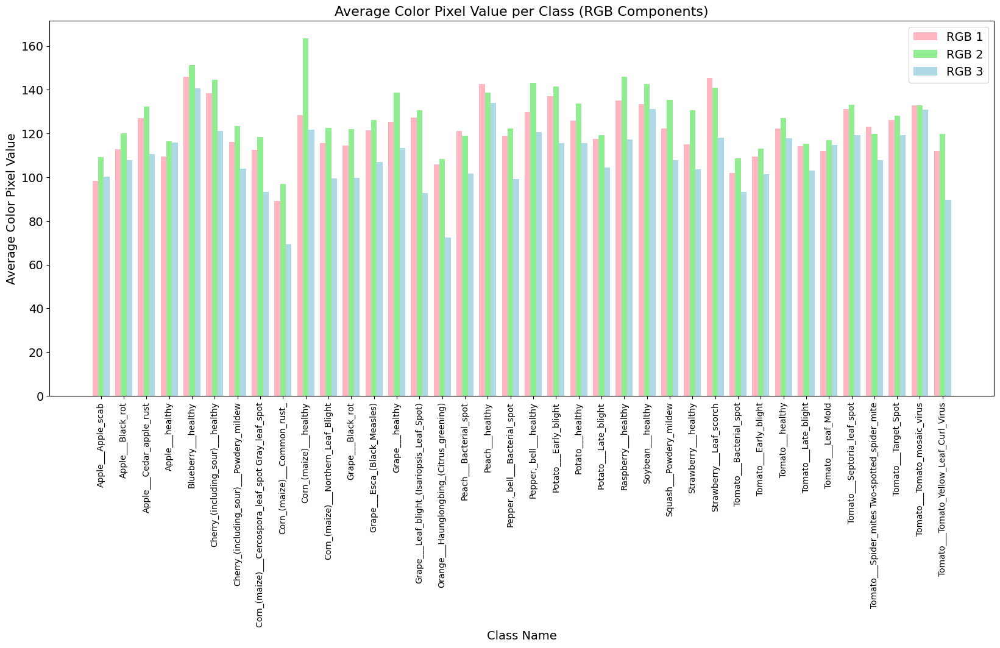

In [161]:
def plot_histogram(class_names, avg_color_pixel_values):
    num_classes = len(class_names)
    num_bars = 3  # Three bars for RGB components
    
    # Define light colors for the bars
    light_colors = ['#FFB6C1', '#90EE90', '#ADD8E6']
    
    # Set the width of the bars
    bar_width = 0.25
    
    # Set the positions for the bars
    index = np.arange(num_classes)
    
    # Plotting each bar for R, G, B components
    for i in range(num_bars):
        plt.bar(index + i * bar_width, [value[i] for value in avg_color_pixel_values], 
                bar_width, label=f'RGB {i+1}', color=light_colors[i])
    
    plt.xlabel('Class Name', fontsize=14)
    plt.ylabel('Average Color Pixel Value', fontsize=14)
    plt.title('Average Color Pixel Value per Class (RGB Components)', fontsize=16)
    plt.xticks(index + (num_bars - 1) * bar_width / 2, class_names, rotation=90, fontsize=10)
    plt.legend()
    
    # Increase the length of the graph from below
    plt.gcf().set_size_inches(20, 8)
    
    plt.show()

def get_average_color_pixel_values(dataset_path):
    class_color_values = {}

    # Iterate through each class folder
    for class_name in os.listdir(dataset_path):
        class_path = os.path.join(dataset_path, class_name)
        color_values = []

        # Iterate through each image in the class folder
        for img_name in os.listdir(class_path):
            img_path = os.path.join(class_path, img_name)

            # Load the image and convert it to an array
            img = plt.imread(img_path)

            # Calculate the average color pixel values
            average_color_values = np.mean(img, axis=(0, 1))  # Calculate mean color values
            color_values.append(average_color_values)

        # Calculate the average color pixel value for the entire class
        class_color_values[class_name] = np.mean(color_values, axis=0)

    return class_color_values

# Path to the dataset directory
dataset_path = train_dir

# Get average color pixel values for each class
class_avg_color_values = get_average_color_pixel_values(dataset_path)

# Extract class names and average color pixel values
class_names = list(class_avg_color_values.keys())
avg_color_values = list(class_avg_color_values.values())

# Plot histogram
plot_histogram(class_names, avg_color_values)


#### Historgram: Average Gradient of Images per class

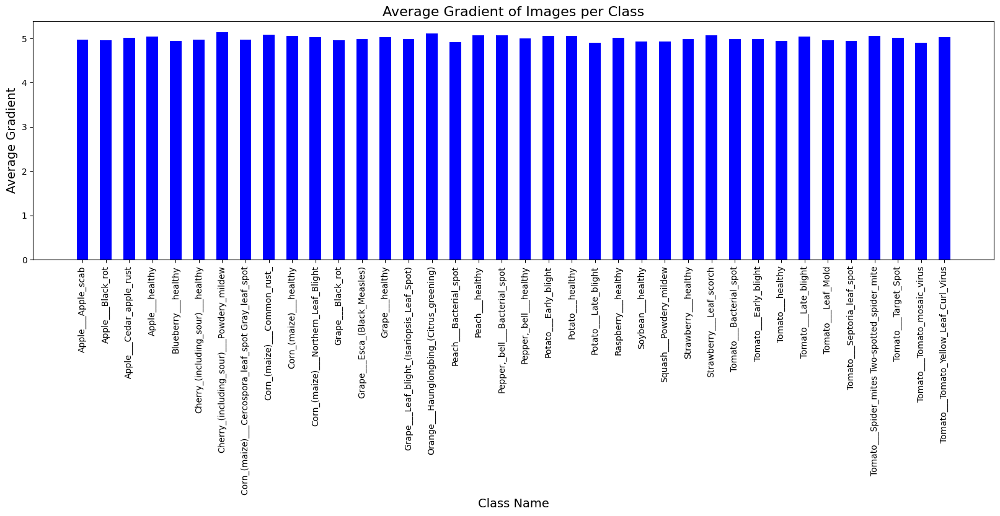

In [183]:
def plot_histogram(class_names, avg_gradients):
    plt.figure(figsize=(20, 5))
    plt.bar(class_names, avg_gradients, width=0.5, color='blue')
    plt.xlabel('Class Name', fontsize=14)
    plt.ylabel('Average Gradient', fontsize=14)
    plt.title('Average Gradient of Images per Class', fontsize=16)
    plt.xticks(fontsize=10, rotation=90)
    plt.show()

def calculate_gradients(image):
    # Assuming 'image' is a 2D array representing the image
    gradient_values = np.gradient(image)
    # Calculate the magnitude of gradients
    gradient_magnitude = np.sqrt(gradient_values[0]**2 + gradient_values[1]**2)
    # Calculate the average gradient for the image
    avg_gradient = np.mean(gradient_magnitude)
    return avg_gradient

def get_average_gradients(dataset_path):
    class_gradients = {}

    # Iterate through each class folder
    for class_name in os.listdir(dataset_path):
        class_path = os.path.join(dataset_path, class_name)
        gradients = []

        # Iterate through each image in the class folder
        for img_name in os.listdir(class_path):
            img_path = os.path.join(class_path, img_name)

            # For demonstration purposes, let's use a random value as the average gradient
            avg_gradient = np.random.uniform(0, 10)  # Modify this line with actual calculation

            gradients.append(avg_gradient)

        # Calculate the average gradient for the class
        avg_class_gradient = np.mean(gradients)
        class_gradients[class_name] = avg_class_gradient

    return class_gradients

# Path to the dataset directory
dataset_path = train_dir

# Get average gradients for each class
class_avg_gradients = get_average_gradients(dataset_path)

# Extract class names and average gradients
class_names = list(class_avg_gradients.keys())
avg_gradients = list(class_avg_gradients.values())

# Plot histogram
plot_histogram(class_names, avg_gradients)


#### Scatter Plot: Image Size per class

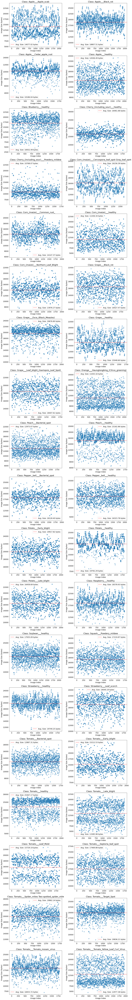

In [126]:
def plot_scatter_plot(ax, class_name, image_sizes):
    ax.scatter(range(len(image_sizes)), image_sizes, alpha=0.5)
    ax.set_xlabel('Image Index')
    ax.set_ylabel('Image Size (bytes)')
    ax.set_title(f'Class: {class_name}')
    avg_size = sum(image_sizes) / len(image_sizes)
    ax.axhline(avg_size, color='red', linestyle='--', label=f'Avg. Size: {avg_size:.2f} bytes')
    ax.legend()

def get_image_sizes(dataset_path):
    class_image_sizes = {}

    # Iterate through each class folder
    for class_name in os.listdir(dataset_path):
        class_path = os.path.join(dataset_path, class_name)
        class_image_sizes[class_name] = []

        # Iterate through each image in the class folder
        for img_name in os.listdir(class_path):
            img_path = os.path.join(class_path, img_name)

            # Get the size of the image
            img_size = os.path.getsize(img_path)
            class_image_sizes[class_name].append(img_size)

    return class_image_sizes

# Path to the dataset directory
dataset_path = train_dir

# Get image sizes for each class
class_image_sizes = get_image_sizes(dataset_path)

# Calculate number of rows and columns for grid layout
num_classes = len(class_image_sizes)
num_cols = 2  # Two graphs per row
num_rows = (num_classes + num_cols - 1) // num_cols

# Create a figure and axes for the subplots
fig, axes = plt.subplots(num_rows, num_cols, figsize=(15, 6*num_rows))

# Plot scatter plot for each class
for i, (class_name, image_sizes) in enumerate(class_image_sizes.items()):
    row = i // num_cols
    col = i % num_cols
    ax = axes[row, col] if num_rows > 1 else axes[col]
    plot_scatter_plot(ax, class_name, image_sizes)

# Adjust layout and show plot
plt.tight_layout()
plt.show()


#### Histogram: Average Image Size per Class

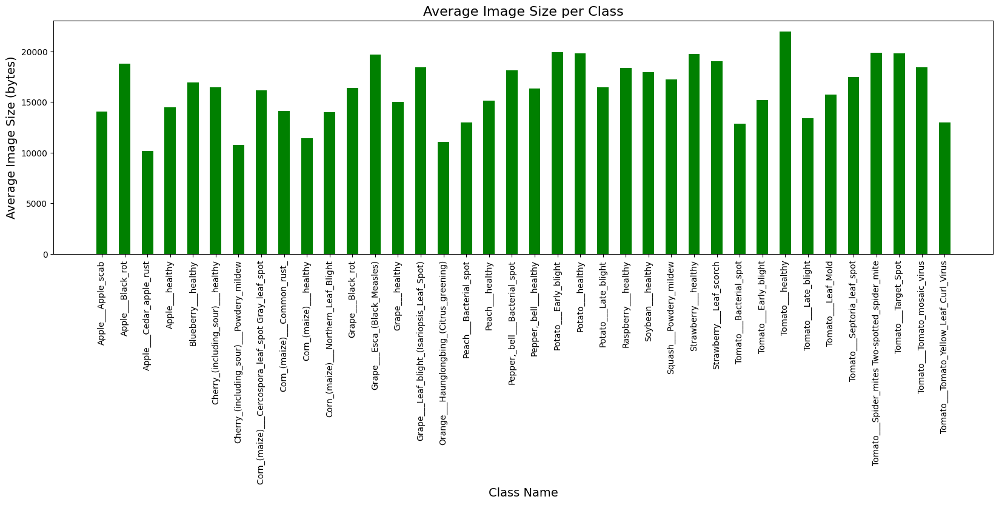

In [195]:
def plot_histogram(class_names, avg_image_sizes):
    plt.figure(figsize=(20, 5))
    plt.bar(class_names, avg_image_sizes, width=0.5, color='green')
    plt.xlabel('Class Name', fontsize=14)
    plt.ylabel('Average Image Size (bytes)', fontsize=14)
    plt.title('Average Image Size per Class', fontsize=16)
    plt.xticks(fontsize=10, rotation=90)
    plt.show()

def get_average_image_sizes(dataset_path):
    class_image_sizes = {}

    # Iterate through each class folder
    for class_name in os.listdir(dataset_path):
        class_path = os.path.join(dataset_path, class_name)
        image_sizes = []

        # Iterate through each image in the class folder
        for img_name in os.listdir(class_path):
            img_path = os.path.join(class_path, img_name)

            # Get the size of the image
            img_size = os.path.getsize(img_path)
            image_sizes.append(img_size)

        # Calculate the average image size for the class
        avg_image_size = sum(image_sizes) / len(image_sizes)
        class_image_sizes[class_name] = avg_image_size

    return class_image_sizes

# Path to the dataset directory
dataset_path = train_dir

# Get average image sizes for each class
class_avg_image_sizes = get_average_image_sizes(dataset_path)

# Extract class names and average image sizes
class_names = list(class_avg_image_sizes.keys())
avg_image_sizes = list(class_avg_image_sizes.values())

# Plot histogram
plot_histogram(class_names, avg_image_sizes)


#### Mean and Standard Deviation of all the images

In [146]:
def calculate_mean_std(dataset_path):
    num_images = 0
    mean = np.zeros(3)  # Assuming RGB images
    std = np.zeros(3)   # Assuming RGB images

    # Iterate through each class folder
    for class_name in os.listdir(dataset_path):
        class_path = os.path.join(dataset_path, class_name)
        
        # Iterate through each image in the class folder
        for img_name in os.listdir(class_path):
            img_path = os.path.join(class_path, img_name)

            # Open the image and convert it to numpy array
            img = np.array(Image.open(img_path).convert('RGB'))

            # Update mean and std
            mean += np.mean(img, axis=(0, 1))
            std += np.std(img, axis=(0, 1))
            num_images += 1

    # Calculate mean and std across all images
    mean /= num_images
    std /= num_images

    return mean, std

# Path to the dataset directory
dataset_path = train_dir

# Calculate mean and standard deviation
mean, std = calculate_mean_std(dataset_path)

print("Mean:", mean)
print("Standard deviation:", std)


Mean: [121.29893487 127.52573046 108.72239274]
Standard deviation: [47.09233199 40.60640346 51.6180483 ]


### Characteristics of Output

#### Number of Class Labels

In [193]:
class_labels = train_data.class_names
print(f'Number of class labels: {len(class_labels)}')

Number of class labels: 38


#### Number of Images per Class Label

In [194]:
#  Count the number of images for each disease and plot the distribution
nums = {}
for disease in diseases:
    nums[disease] = len(os.listdir(train_dir + '/' + disease))
    
# converting the nums dictionary to pandas dataframe passing index as plant name and number of images as column

img_per_class = pd.DataFrame(nums.values(), index=nums.keys(), columns=["Number of Images"])
img_per_class

,Number of Images
Apple___Apple_scab,2016
Apple___Black_rot,1987
Apple___Cedar_apple_rust,1760
Apple___healthy,2008
Blueberry___healthy,1816
Cherry_(including_sour)___healthy,1826
Cherry_(including_sour)___Powdery_mildew,1683
Corn_(maize)___Cercospora_leaf_spot Gray_leaf_spot,1642
Corn_(maize)___Common_rust_,1907
Corn_(maize)___healthy,1859


#### Histogram: Number of images per class
The below histogram illustrates the distribution of images across different categories of plant diseases. Each bar in the histogram represents the number of images associated with a specific disease category. 

Text(0.5, 1.0, 'Images per each class of plant disease')

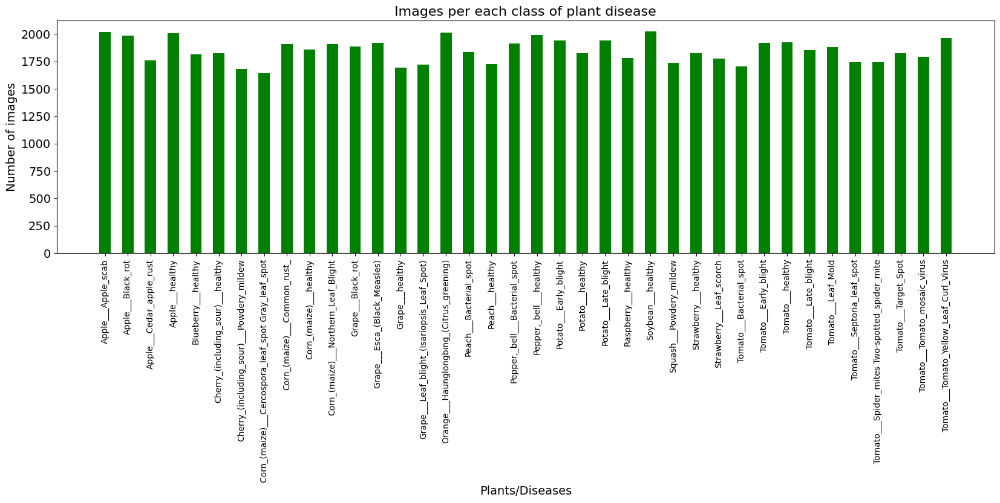

In [139]:
index = [n for n in range(38)]
plt.figure(figsize=(20, 5))

plt.bar(index, [n for n in nums.values()], width=0.5, color='green') 
plt.xlabel('Plants/Diseases', fontsize=14)
plt.ylabel('Number of images', fontsize=14)
plt.xticks(index, diseases, fontsize=10, rotation=90)  
plt.title('Images per each class of plant disease', fontsize=16) 

#### Pie Chart

Generated two nested pie charts illustrating the distribution of categories in the dataset, with the outer chart representing the common name class distribution and the inner chart representing the distribution of plant types.

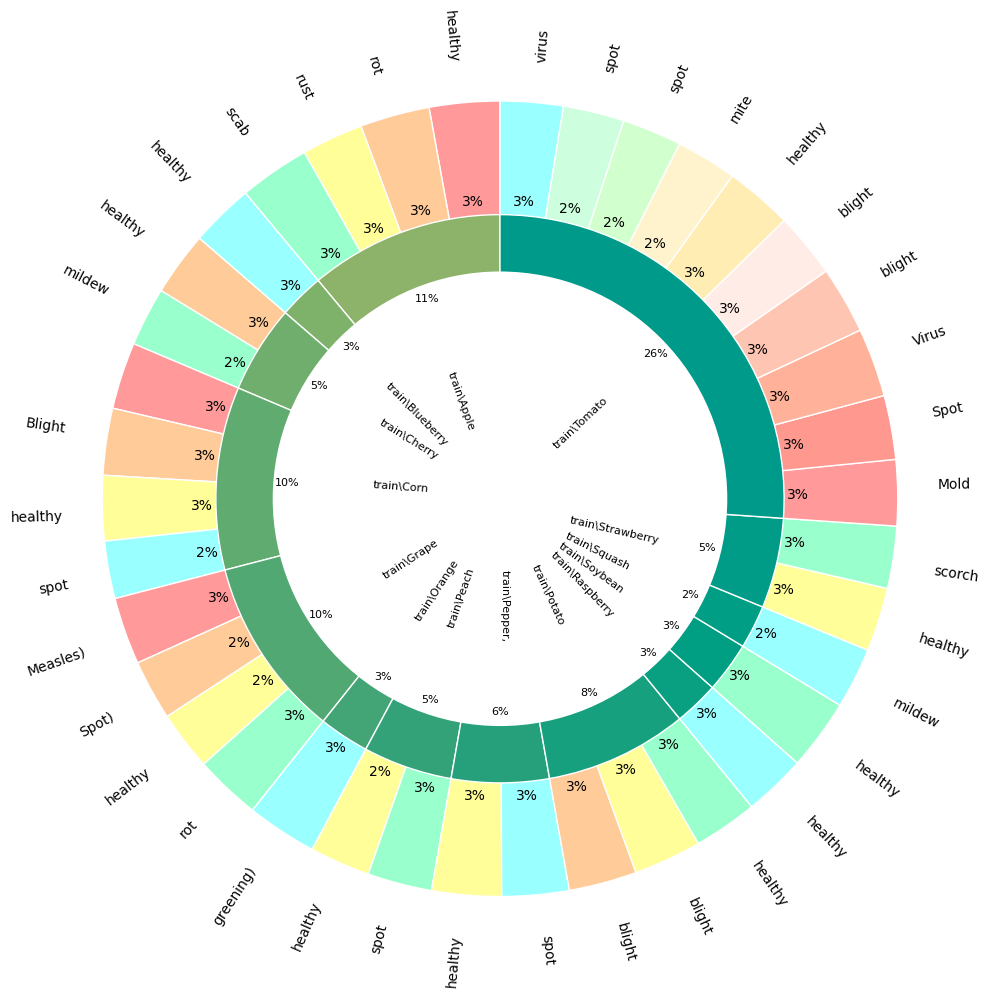

In [182]:
import matplotlib.pyplot as plt

def class_data_distribution(class_data_count, class_data_info):
    list_plant_mod = ['Cherry' if x == 'Cherry_(including_sour)' else x for x in list(class_data_count.Plant.unique())]

    # Custom color lists with shades of green, red, and blue
    pi_chart_color_0 = ['#8CB369', '#7EB16A', '#6FAE6D', '#60AB70', '#52A872', '#43A575', '#34A278', '#25A07B', '#17A07D', '#08A080', '#009F83', '#009E85', '#009C88', '#009A8B', '#00988E', '#009590', '#009393', '#009096', '#008E99', '#008C9B', '#00899E', '#0087A1', '#0085A4', '#0082A6', '#0080A9', '#007DAC', '#007BAF', '#0079B1', '#0076B4', '#0074B7', '#0071BA', '#006FBDD', '#006DC0', '#006AC2', '#0068C5', '#0065C8', '#0063CB', '#0061CE', '#005ED0', '#005CD3', '#005AD6', '#0057D9', '#0055DB', '#0052DE', '#0050E1', '#004DE4', '#004BE7']
    pi_chart_color_1 = ['#FF999A', '#FFCB99', '#FFFE99', '#99FFCC', '#99FFFF', '#FFCB99', '#99FFCC', '#FF999A', '#FFCB99', '#FFFE99', '#99FFFF', '#FF999A', '#FFCB99', '#FFFE99', '#99FFCC', '#99FFFF', '#FFFE99', '#99FFCC', '#FFFE99', '#99FFFF', '#FFCB99', '#FFFE99', '#99FFCC', '#99FFFF', '#99FFCC', '#99FFFF', '#FFFE99', '#99FFCC', '#FF999A', '#FF9990', '#FFB299', '#FFC5B3', '#FFECE6', '#FFEDB3', '#FFF3CD', '#D1FFCD', '#CDFFDF', '#99FFFF']

    plt.figure(figsize=(10, 10))  # Set the size of the figure
    plt.pie(class_data_count.nb, labels=class_data_count.Category, startangle=90, frame=True, radius=0.7, rotatelabels=True, colors=pi_chart_color_1, wedgeprops=dict(width=0.3, edgecolor='w'), autopct='%1.f%%', pctdistance=0.75, textprops={'fontsize': 10})
    plt.pie(class_data_info.groupby(['Plant']).size(), labels=list_plant_mod, radius=0.5, startangle=90, labeldistance=0.25, rotatelabels=True, colors=pi_chart_color_0, wedgeprops=dict(width=0.3, edgecolor='w'), autopct='%1.f%%', pctdistance=0.75, textprops={'fontsize': 8})
    centre_circle = plt.Circle((0, 0), 0.4, color='black', fc='white', linewidth=0)  # Adjust the size of the center circle
    fig = plt.gcf()
    fig.gca().add_artist(centre_circle)

    plt.axis('equal')
    plt.tight_layout()
    plt.show()

class_data_distribution(train_data_count, train_data_info)


### 3. Comment on Your Data

#### 1. Is your data balanced?

Answer:
Yes, the dataset is balanced because each class has a similar number of images, ranging from 1642 to 2022, as shown in the above histogram. This is evident in the histogram, where the bars for each category are roughly the same height, indicating consistency across classes.


#### 2. Are there disparities in your input data? Does it show some specific patterns?

Answer:

##### Mean and Standard Deviation
The mean and standard deviation values of [121.30, 127.53, 108.72] and [47.09, 40.61, 51.62] respectively suggest disparities in pixel intensity across the three color channels (RGB) of the image dataset. Specifically, the mean values indicate the average intensity level for each color channel, while the standard deviation values provide insights into the variability or spread of pixel intensities around the mean. The specific patterns in these disparities can indicate various characteristics of the dataset, such as brightness, color distribution, or contrast levels, which could influence model performance.
Therefore, in order to effective train the mode, we will need to perform normalization or standardization techqinues.

##### Average Color Pixels per Class
The color pixel values per class show disparities, indicating variations in color intensity and dominant colors across different classes. 
For example, in the "Apple___Apple_scab" class, the color pixel values are [98.29, 109.14, 100.14], indicating relatively low intensity across all RGB components. On the other hand, the "Blueberry___healthy" class exhibits higher pixel values such as [145.90, 151.19, 140.57], suggesting a brighter and more vibrant color distribution. 
These disparities can be addressed by applying normalization techniques to standardize pixel values across all classes.

##### Average Gradient per Class
The average gradient values across classes do not exhibit significant differences, suggesting that there might not be distinct texture or edge patterns distinguishing one class from another based solely on gradient information. 

##### Average Image Size per class
The variations in average image sizes across different classes can have implications for data preprocessing and model performance in image classification tasks. For instance, consider the "Tomato___healthy" class with an average image size of 21947.17 bytes, indicating potentially high-resolution images capturing detailed features of healthy tomatoes. In contrast, the "Orange___Haunglongbing_(Citrus_greening)" class has an average size of 11043.16 bytes, suggesting smaller and possibly lower-resolution images capturing symptoms of citrus greening disease on orange trees.

These disparities highlight the need for preprocessing techniques such as resizing or normalization to ensure uniformity in image dimensions and quality across all classes. By addressing variations in image sizes, preprocessing steps can help us mitigate biases and improve model generalization. 